# LONG Yongkang

# Style-Transfer and Texture Synthesis

In this project, the goal is to reimplement certain aspects of <b>three</b> papers for style transfer and texture synthesis.

# Image Style Transfer Using Convolutional Neural Networks [1]

The goal of the approach described in [1] is to transfer the style of a style image $\vec{a}$ to a content image $\vec{p}$ by gradually applying changes to a target image $\vec{x}$ that is initially showing white noise (or for performance reasons the content image $\vec{p}$) such that $\vec{x}$ converges to an image that shows the content of $\vec{p}$ (e.g. KAUST) in the style of $\vec{a}$ (similar colors, brush strokes etc.) (cf. figure below) Details about the method are provided in the paper [1] and in Appendix A.

<center><img src='img/overview.jpg' width=80% /></center>

## Library imports and definition of some helper functions (do not change anything)

In [3]:
# import all needed resources
%matplotlib inline

from PIL import Image
from io import BytesIO
import os
import math
import matplotlib.pyplot as plt
import numpy as np
import time
import sys

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset
import requests
from torchvision import transforms, models

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
def load_image(img_path, max_size = 400, shape = None):
    
    ''' Load and downscale an image if the shorter side is longer than <max_size> px '''
    
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')
    
    if min(image.size) > max_size:
        size = max_size
    else:
        size = min(image.size)
    
    if shape is not None:
        size = shape
    
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard alpha channel (:3) and append the batch dimension (unsqueeze(0))
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

In [6]:
# helper function for un-normalizing an image 
# and converting it from a Tensor image to a NumPy image for display
def im_convert(tensor):
    """ Convert a PyTorch tensor to a NumPy image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

In [7]:
''' Define and load corresponding content/style pairs '''

content_files = ['kaust', 'tesla', 'hamilton', 'mandela']
style_files = ['starry_night', 'jesuiten', 'scream', 'ben_passmore']
ref_vgg_files = ['vgg0_ref', 'vgg1_ref', 'vgg2_ref', 'vgg3_ref']
ref_resnet_files = ['res0_ref', 'res1_ref', 'res2_ref', 'res3_ref']

# load in content and style images
content = [load_image('img/content/' + c + '.jpg').to(device) for c in content_files]

# Resize style images to match corresponding content, makes code easier
style = [load_image('img/style/' + s + '.jpg', shape=content[n].shape[-2:]).to(device) for n, s in enumerate(style_files)]

# Reference Solution
ref_vgg =  [load_image('img/ref/' + c + '.jpg').to(device) for c in ref_vgg_files]

# Create Target image and prepare it for change (requires_grad_(True))
# Starting with the content image and applying the style is usually faster than starting from a random image

# Target Image = Content Image
target = [c.clone().requires_grad_(True).to(device) for c in content]

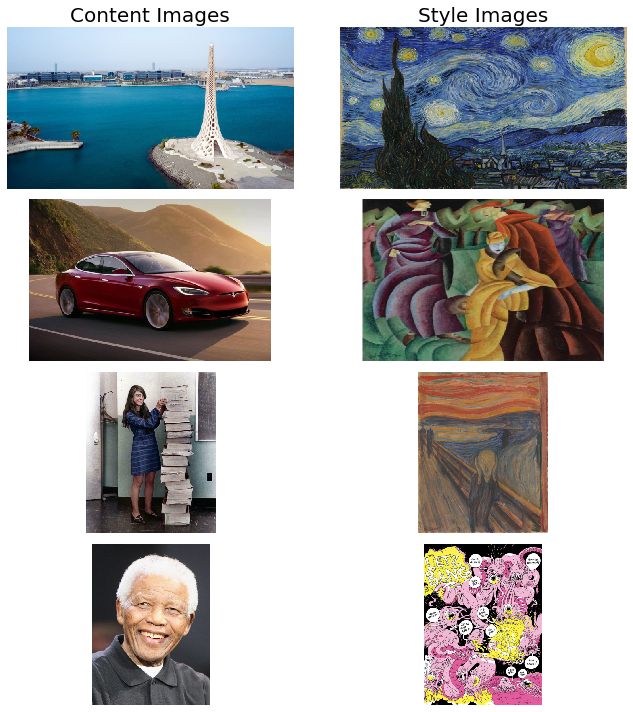

In [8]:
# display the images
num_pairs = len(content)
fig, axs = plt.subplots(num_pairs, 2, figsize=(10, 10))

axs[0, 0].set_title('Content Images', fontsize=20)
axs[0, 1].set_title('Style Images', fontsize=20)
#axs[0, 2].set_title('Target Images', fontsize=20)

# content and correspoinding style image side-by-side
for row in range(0, num_pairs):
        axs[row, 0].imshow(im_convert(content[row]))
        axs[row, 1].imshow(im_convert(style[row]))
        #axs[row, 2].imshow(im_convert(target[row]))

        for col in range(0, 2):
            axs[row, col].axis('off')
        
fig.tight_layout()
plt.show()

In [7]:
def get_features(image, model, layers):
    # Run an image forward through a model and get the features for a set of layers.
        
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

## Task 1: Calculate the $d \times d$ gram matrix corresponding to a $1 \times d \times h \times w$ tensor (5 points)

As described in [1], the style of an image can be represented by the Gram matrix of a layer consisting of a set of features maps. Ensure that the computation also works for batch sizes > 1 and that the result is a 4d rensor.

In [30]:
def gram_matrix(tensor, normalize = False):
    """ Calculate the Gram Matrix of a given tensor 
        Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """
    
    # TODO Task 1: Implement the computation of the Gram Matrix
    
    ## get the batch_size b, depth c, height h, and width w of the Tensor
    ## reshape it, so we're multiplying the features for each channel
    ## calculate the gram matrix
    b,c, h, w = tensor.size()
    tensor = tensor.view(c, h * w)
    gram = torch.mm(tensor, tensor.t())
    
    ## if normalize = True, normalize the gram matrix as it is done in Equation 3 of [5]
    
    #gram = None
    
    return gram

## Task 2: Complete the Training Function (10 points)

In order to complete this task, you might want to refer to the paper [1] and to the Appendix A. Note that the equations in Appendix A slightly differ from the originals in the paper. However, we highly recommend the equations in Appendix A since the equations in the paper seem to be inconsistent to the original implementation of the authors and are obviously missing normalization.

In [35]:
def run_model(model, layers, target, content_features, style_grams, content_layer, style_weights, content_weight = 1, style_weight = 1.0e12, steps = 5000, lr = 0.003):
    
    # for displaying the loss values, intermittently
    show_every = 500

    # iteration hyperparameters
    optimizer = optim.Adam([target], lr=lr)
    
    # Values of the learning curve
    learning_curve = np.zeros(steps)
    
    print(learning_curve.shape)

    start = time.time()

    for ii in range(1, steps+1):

        ## TODO Task 2: get the features from the target image w.r.t. the provided model and the required layers
        target_features =  get_features(target, model,layers)
        
        ## TODO Task 2: calculate the content loss (refer to Appendix A for details about the formula)
        content_loss = torch.mean((target_features[content_layer] -
                             content_features[content_layer]) ** 2)

        # the style loss
        # initialize the style loss to 0
        style_loss = 0
        
        # then add to it for each layer's gram matrix loss
        for layer in style_weights:

            target_feature = target_features[layer]

            _, d, h, w = target_feature.shape

            ## TODO Task 2: Calculate the target gram matrix
            target_gram = gram_matrix(target_feature)

            ## TODO Task 2: get the "style" style representation
            style_gram = style_grams[layer]

            ## TODO Task 2: Calculate the style loss for one layer, weighted appropriately (again, refer to Appendix A for details)
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram) ** 2)
            
            # add to the style loss
            style_loss += layer_style_loss / (h * w)**2

        # TODO Task 2: calculate the *total* loss
        total_loss = content_weight * content_loss + style_weight * style_loss

        learning_curve[ii - 1] = total_loss

        # update your target image
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # display intermediate images and print the loss
        if  ii % show_every == 0:
            print('Total loss: ', total_loss.item())
            print('Weighted Content loss: ', content_weight * content_loss.item())
            print('Weighted Style loss: ', style_weight * style_loss.item())

            end = time.time()
            print('Time [s]: ', (end - start))
            plt.imshow(im_convert(target))
            plt.show()

    end = time.time()
    print('Total Time [s]: ', (end - start))
    
    return [target, learning_curve]

## VGG Network
We want to use the VGG-19 network for feature extraction first, since it was also suggestend by the authors of [1].

In [10]:
# get the "features" portion of VGG19 (we will not need the "classifier" portion)
vgg = models.vgg19(pretrained=True).features.to(device)

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

In [11]:
# print out VGG19 structure so you can see the numbers of various layers
print(vgg)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## Task 3: Complete the mapping from VGG layer numbers to layer names (5 points)

Refer to the paper [1] to identify the layers that are suitable for content and style representation and complete the dictionary below that maps from layer numbers (in string representation!) to layer names.
You may also want to print the VGG network using the print command above to see the layer numbers together with the corresponding layers.

In [13]:
## TODO Task 3: Complete mapping layer names of PyTorch's VGGNet to names from the paper
## Need the layers for the content and style representations of an image

# definition of all the layers needed from VGG net
layers_vgg = {'0': 'conv1_1',
              '5': 'conv2_1',
              '10': 'conv3_1',
              '19': 'conv4_1',
              '21': 'conv4_2', #content layer
              '28': 'conv5_1'}

In [31]:
# get content and style features only once before training
content_features_vgg = [get_features(c, vgg, layers_vgg) for c in content]
style_features_vgg = [get_features(s, vgg, layers_vgg) for s in style]

# calculate the gram matrices for each layer of our style representation
#style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}
style_grams_vgg = [{layer: gram_matrix(s[layer]) for layer in s} for s in style_features_vgg]

In [32]:
# Weights for VGG net
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` which is used for content representation

style_weights_vgg = {'conv1_1': 1.,
                     'conv2_1': 0.8,
                     'conv3_1': 0.5,
                     'conv4_1': 0.3,
                     'conv5_1': 0.1}

## Task 4: Styler Transfer using the VGG network (10 points - 4 examples, 2.5 points each)

Experiment with different weights for style (1.0e3, 1.0e6, 1.0e9, 1.0e12), different numbers of steps (e.g. 500, 1000, 2000) and different learning rates (e.g. 0.1, 0.01, 0.001) to find a set of parameters with which you can create a stylized image that looks similar to the provided reference solution as fast / efficient as possible. Plot the learning curve and put both the learning curvevs and training times together with the final result to your final report.

(2000,)
Total loss:  94136262656.0
Weighted Content loss:  7.862957954406738
Weighted Style loss:  94136260449.88632
Time [s]:  14.866427659988403


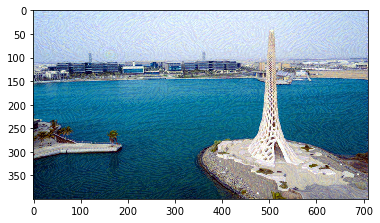

Total loss:  49444192256.0
Weighted Content loss:  8.386516571044922
Weighted Style loss:  49444191157.81784
Time [s]:  29.992769956588745


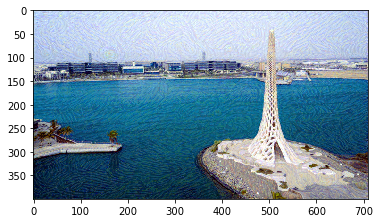

Total loss:  29143580672.0
Weighted Content loss:  8.645040512084961
Weighted Style loss:  29143581166.86344
Time [s]:  45.14484477043152


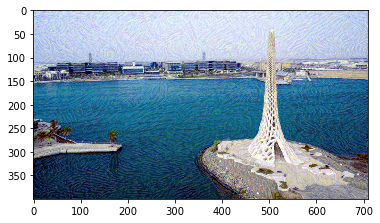

Total loss:  18799921152.0
Weighted Content loss:  8.813705444335938
Weighted Style loss:  18799921497.7026
Time [s]:  60.31930589675903


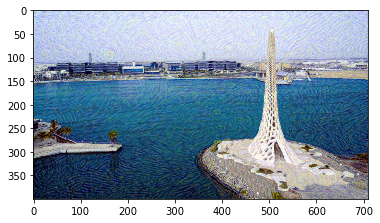

Total Time [s]:  60.53765892982483


In [36]:
# TODO Task 4: Style Transfer for content[0] and style[0] stored in target[0]
[s_0, slc_0] = run_model(vgg, layers_vgg, target[0], content_features_vgg[0], style_grams_vgg[0], 'conv4_2', style_weights_vgg, content_weight = 1, style_weight = 1.0e12, steps = 2000, lr = 0.003)

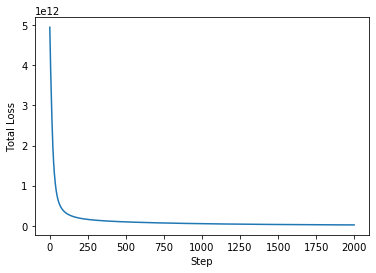

In [37]:
plt.plot(slc_0)
plt.xlabel('Step')
plt.ylabel('Total Loss')
plt.show()

(5000,)
Total loss:  33516410880.0
Weighted Content loss:  7.408236503601074
Weighted Style loss:  33516410738.22975
Time [s]:  12.556405782699585


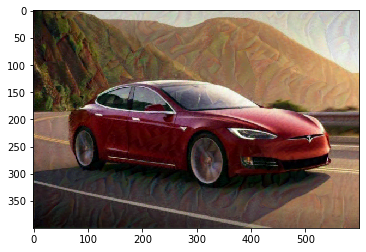

Total loss:  19533299712.0
Weighted Content loss:  7.875080585479736
Weighted Style loss:  19533300772.309303
Time [s]:  25.383909463882446


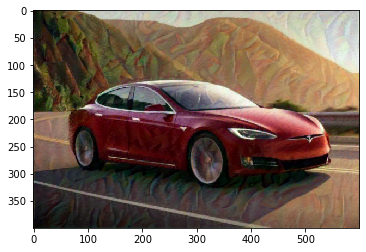

Total loss:  14267339776.0
Weighted Content loss:  8.102770805358887
Weighted Style loss:  14267339371.144772
Time [s]:  38.26902770996094


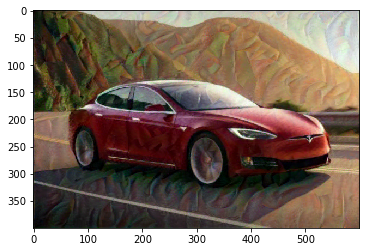

Total loss:  11338485760.0
Weighted Content loss:  8.259839057922363
Weighted Style loss:  11338485404.849052
Time [s]:  51.14576601982117


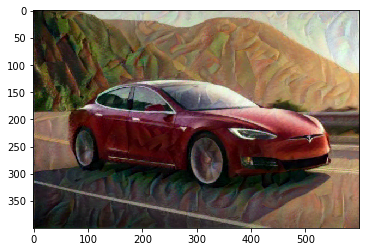

Total loss:  9481743360.0
Weighted Content loss:  8.380794525146484
Weighted Style loss:  9481742978.096008
Time [s]:  64.05671763420105


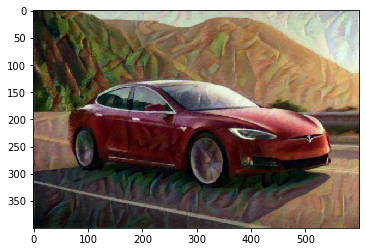

Total loss:  8166595584.0
Weighted Content loss:  8.474205017089844
Weighted Style loss:  8166595362.126827
Time [s]:  76.91597962379456


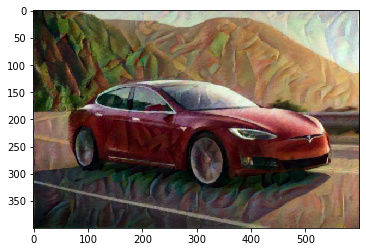

Total loss:  7184672768.0
Weighted Content loss:  8.552340507507324
Weighted Style loss:  7184672635.048628
Time [s]:  89.79275298118591


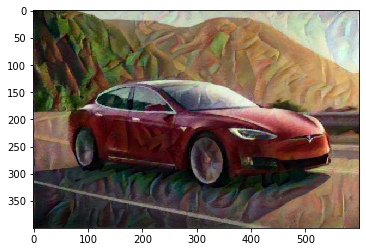

Total loss:  6436033024.0
Weighted Content loss:  8.629661560058594
Weighted Style loss:  6436033174.395561
Time [s]:  102.6857762336731


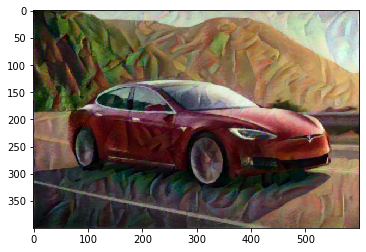

Total loss:  5869245952.0
Weighted Content loss:  8.692498207092285
Weighted Style loss:  5869246087.968349
Time [s]:  115.6592128276825


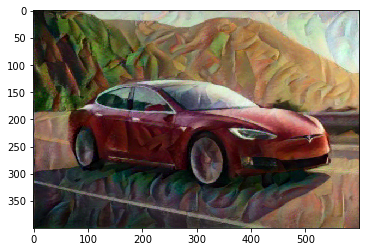

Total loss:  5451205120.0
Weighted Content loss:  8.744229316711426
Weighted Style loss:  5451205186.545849
Time [s]:  128.53964114189148


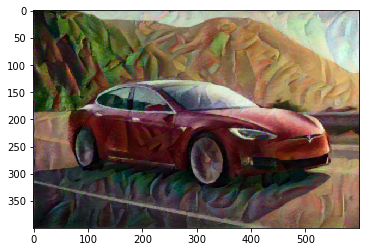

Total Time [s]:  128.74434185028076


In [38]:
# TODO Task 4: Style Transfer for content[1] and style[1] stored in target[1]
[s_1, slc_1] = run_model(vgg, layers_vgg, target[1], content_features_vgg[1], style_grams_vgg[1], 'conv4_2', style_weights_vgg, content_weight = 1, style_weight = 1.0e12, steps = 5000, lr = 0.003)

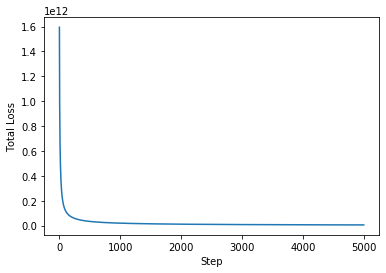

In [39]:
plt.plot(slc_1)
plt.xlabel('Step')
plt.ylabel('Total Loss')
plt.show()

(5000,)
Total loss:  43664101376.0
Weighted Content loss:  8.143228530883789
Weighted Style loss:  43664101511.240005
Time [s]:  10.831913471221924


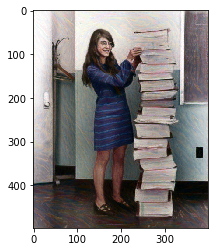

Total loss:  24365279232.0
Weighted Content loss:  8.611506462097168
Weighted Style loss:  24365279823.54164
Time [s]:  21.82915997505188


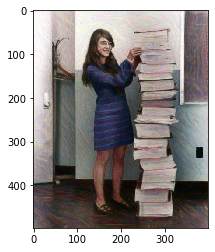

Total loss:  16864983040.0
Weighted Content loss:  8.833704948425293
Weighted Style loss:  16864983364.93969
Time [s]:  32.92352914810181


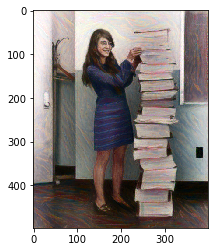

Total loss:  12755388416.0
Weighted Content loss:  8.99407958984375
Weighted Style loss:  12755388393.998146
Time [s]:  43.91693568229675


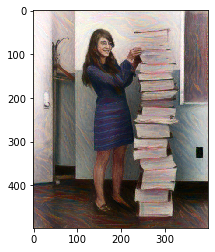

Total loss:  10160920576.0
Weighted Content loss:  9.11143970489502
Weighted Style loss:  10160920210.182667
Time [s]:  54.9539635181427


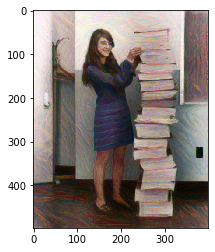

Total loss:  8366581248.0
Weighted Content loss:  9.201653480529785
Weighted Style loss:  8366581052.541733
Time [s]:  65.95542216300964


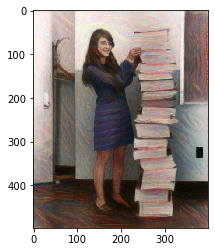

Total loss:  7051169280.0
Weighted Content loss:  9.270835876464844
Weighted Style loss:  7051169406.622648
Time [s]:  76.95066714286804


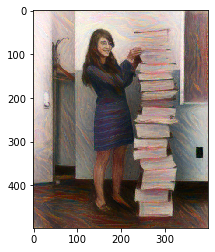

Total loss:  6066019840.0
Weighted Content loss:  9.326346397399902
Weighted Style loss:  6066019646.823406
Time [s]:  87.96760892868042


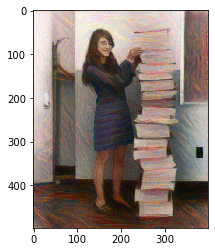

Total loss:  5328589312.0
Weighted Content loss:  9.37562370300293
Weighted Style loss:  5328589119.017124
Time [s]:  98.98028326034546


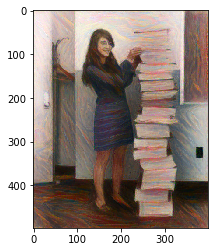

Total loss:  4734238720.0
Weighted Content loss:  9.426344871520996
Weighted Style loss:  4734238609.671593
Time [s]:  109.99580693244934


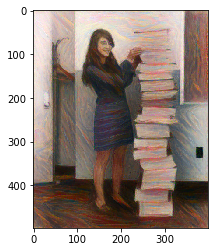

Total Time [s]:  110.27477502822876


In [40]:
# TODO Task 4: Style Transfer for content[2] and style[2] stored in target[2]
[s_2, slc_2] = run_model(vgg, layers_vgg, target[2], content_features_vgg[2], style_grams_vgg[2], 'conv4_2', style_weights_vgg, content_weight = 1, style_weight = 1.0e12, steps = 5000, lr = 0.003)

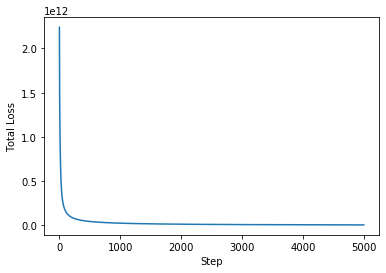

In [41]:
plt.plot(slc_2)
plt.xlabel('Step')
plt.ylabel('Total Loss')
plt.show()

(5000,)
Total loss:  5676295258112.0
Weighted Content loss:  27.03607177734375
Weighted Style loss:  5676295280456.543
Time [s]:  11.951332330703735


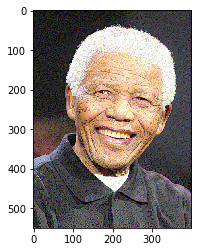

Total loss:  2630308855808.0
Weighted Content loss:  28.28748893737793
Weighted Style loss:  2630308866500.8545
Time [s]:  24.08893918991089


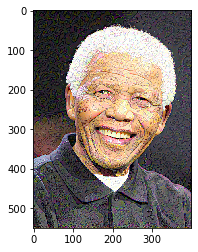

Total loss:  1654326689792.0
Weighted Content loss:  28.999271392822266
Weighted Style loss:  1654326677322.3877
Time [s]:  36.233718395233154


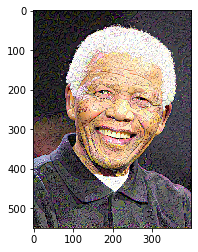

Total loss:  1170458148864.0
Weighted Content loss:  29.493000030517578
Weighted Style loss:  1170458197593.689
Time [s]:  48.52168416976929


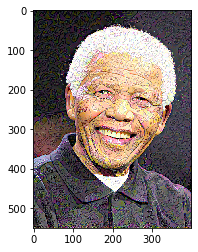

Total loss:  884647067648.0
Weighted Content loss:  29.837953567504883
Weighted Style loss:  884647071361.5417
Time [s]:  60.66175580024719


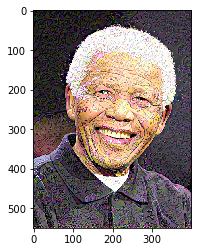

Total loss:  696358600704.0
Weighted Content loss:  30.07007598876953
Weighted Style loss:  696358621120.4529
Time [s]:  72.80746030807495


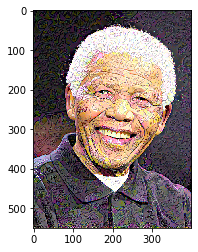

Total loss:  563880656896.0
Weighted Content loss:  30.26786231994629
Weighted Style loss:  563880681991.5771
Time [s]:  84.93299603462219


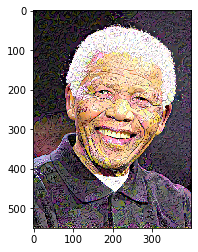

Total loss:  466394054656.0
Weighted Content loss:  30.44744110107422
Weighted Style loss:  466394066810.6079
Time [s]:  97.06983089447021


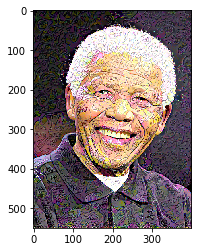

Total loss:  391313096704.0
Weighted Content loss:  30.617807388305664
Weighted Style loss:  391313105821.6095
Time [s]:  109.1971788406372


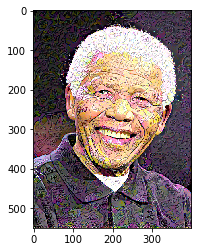

Total loss:  332159090688.0
Weighted Content loss:  30.77163314819336
Weighted Style loss:  332159101963.0432
Time [s]:  121.34016013145447


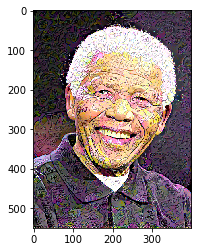

Total Time [s]:  121.49307250976562


In [42]:
# TODO Task 4: Style Transfer for content[3] and style[3] stored in target[3]
[s_3, slc_3] = run_model(vgg, layers_vgg, target[3], content_features_vgg[3], style_grams_vgg[3], 'conv4_2', style_weights_vgg, content_weight = 1, style_weight = 1.0e12, steps = 5000, lr = 0.003)

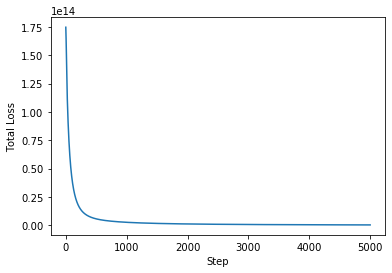

In [43]:
plt.plot(slc_3)
plt.xlabel('Step')
plt.ylabel('Total Loss')
plt.show()

In [44]:
def result_to_hd(image, filePath):
    image = im_convert(image)

    formatted = (image * 255 / np.max(image)).astype('uint8')
    pil_image = Image.fromarray(formatted, 'RGB')
    pil_image.save(filePath, "JPEG")

In [45]:
# Save results to hard disc
result_to_hd(s_0, "s0.jpg")
result_to_hd(s_1, "s1.jpg")
result_to_hd(s_2, "s2.jpg")
result_to_hd(s_3, "s3.jpg")

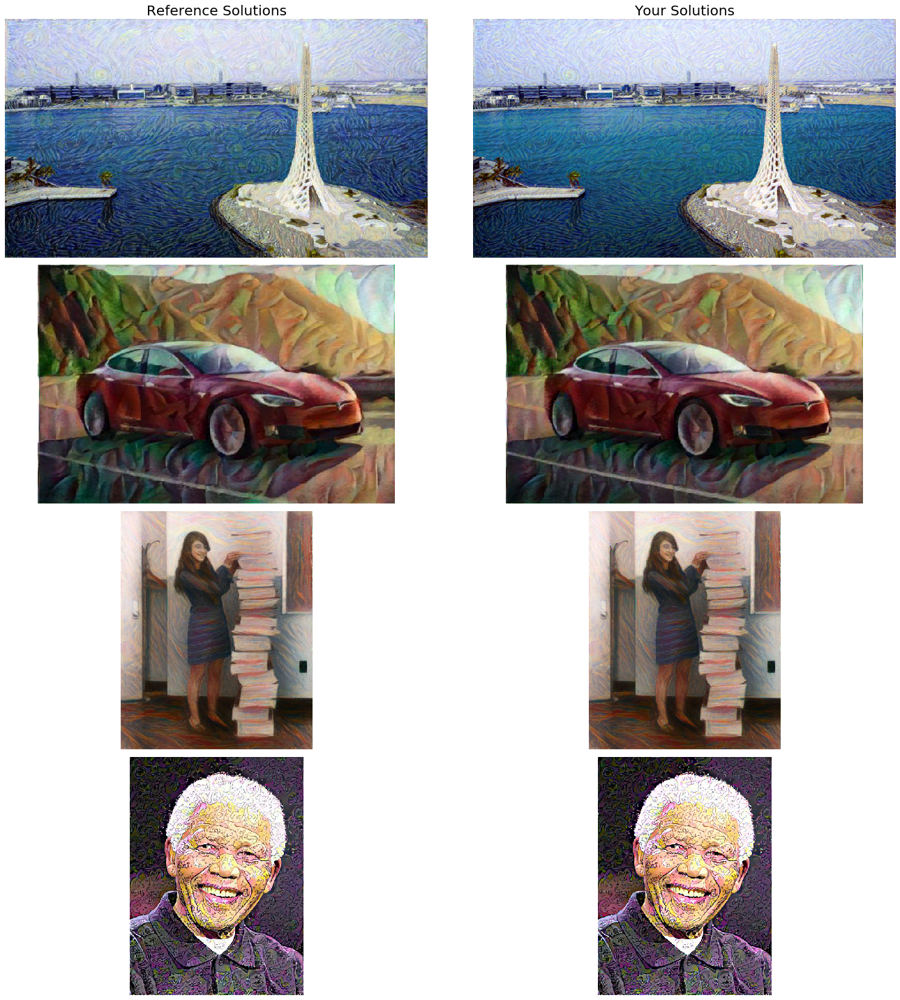

In [46]:
# Comparison to Reference Solution - Do not change anything, just execute to varify correctness of your solution

fig, axs = plt.subplots(num_pairs, 2, figsize=(20, 20))

axs[0, 0].set_title('Reference Solutions', fontsize=20)
axs[0, 1].set_title('Your Solutions', fontsize=20)

# content and correspoinding style image side-by-side
for row in range(0, num_pairs):
        axs[row, 0].imshow(im_convert(ref_vgg[row]))
        axs[row, 1].imshow(im_convert(target[row]))

        for col in range(0, 2):
            axs[row, col].axis('off')
        
fig.tight_layout()
plt.show()

In [9]:
content_img_name = 'chicago'
content_img_path = os.path.join('img', 'content', content_img_name + '.jpg')
content_torch = load_image(content_img_path).to(device)

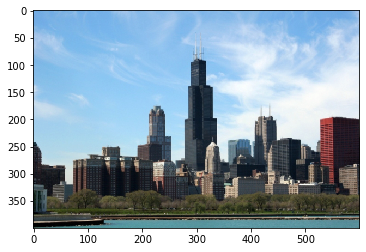

In [11]:
plt.imshow(im_convert(content_torch))

In [18]:
style_names = ['candy', 'composition_vii', 'feathers', 'la_muse', 'mosaic', 'starry_night_crop', 'the_scream' 'udnie', 'wave_crop']
style_idx = 4

print('Chosen Style:', style_names[style_idx])

Chosen Style: mosaic


In [19]:
style_image_path = os.path.join('img', 'style', style_names[style_idx] + '.jpg')
style_image = load_image(style_image_path).to(device)

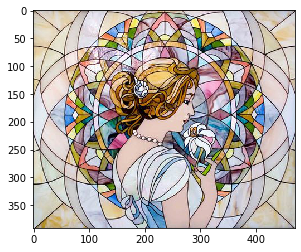

In [20]:
plt.imshow(im_convert(style_image))